## Cluster Full Dataset

### Train ClusterClassifier on Subset

In [ ]:
from datasets import load_dataset

ds = load_dataset('openpecha/cleaned_MT_v1.0.3', split='train').select(range(500_000))['Target']

In [ ]:
from easy_text_clustering.clusterer import ClusterClassifier

cc = ClusterClassifier(embed_device='cuda', summary_create=False)

cc.fit(ds, clustering_args={'cluster_selection_method':'leaf','min_cluster_size':150, 'cluster_selection_epsilon': .15})

cc.save('500k-sample-cc')

cc.show()

In [ ]:
cc.cluster_summaries = cc.summarize(cc.texts, cc.cluster_labels)

In [ ]:
cc.fit(ds, clustering_args={'cluster_selection_method':'leaf','min_cluster_size':200, 'cluster_selection_epsilon': 0.1})
cc.show()

In [ ]:
from easy_text_clustering.clusterer import ClusterClassifier

cc = ClusterClassifier(embed_device='cuda')

cc.load('500k-sample-cc')

### Inference on Full Dataset

In [ ]:
from datasets import load_dataset

texts = load_dataset('openpecha/cleaned_MT_v1.0.3', split='train')['Target']

labels, embeddings = cc.infer(texts)

### Create New ClusterClassifier For Full Set

In [ ]:
new_cc = ClusterClassifier()

new_cc.texts = texts
new_cc.embeddings = embeddings # from inference above
new_cc.projections, new_cc.mapper = new_cc.project(embeddings, 'umap', {})
new_cc.cluster_labels = labels # from inference above
new_cc.store_cluster_info(new_cc.cluster_labels)
new_cc.cluster_summaries = new_cc.summarize(new_cc.texts, new_cc.cluster_labels)

In [ ]:
new_cc.save('full-inferred-cc')

In [ ]:
new_cc.show()

### Inspect Clusters

In [ ]:
from easy_text_clustering.clusterer import ClusterClassifier
new_cc = ClusterClassifier()
new_cc.load('full-inferred-cc')

In [ ]:
new_cc.cluster_summaries

### Separate Out Non-Buddhist Material

In [ ]:
non_buddhist_labels = [1,2,3,5,6,7,9,11,12,16,18,19,20,28,29,31]
non_buddhist_idx = []

for i in non_buddhist_labels:
    non_buddhist_idx.extend(new_cc.label2docs[i])

In [ ]:
buddhist_idx = list(set(range(len(new_cc.texts))) - set(non_buddhist_idx))

In [ ]:
idx_dict = {'Buddhist':buddhist_idx, 'Non-Buddhist': non_buddhist_idx}

In [ ]:
import pickle

with open('buddhist-or-no-idx-dict.pkl', 'wb') as handle:
    pickle.dump(idx_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

## Cluster Non-Buddhist Material

In [ ]:
import pickle

with open('buddhist-or-no-idx-dict.pkl', 'rb') as handle:
    idx_dict = pickle.load(handle)

In [ ]:
from datasets import load_dataset

ds = load_dataset('openpecha/cleaned_MT_v1.0.3', split='train')['Target']

nb_dict = [{'orig_idx':_, 'text':ds[_]} for _ in idx_dict['Non-Buddhist']]

nb_dict[0]

In [ ]:
nb_texts = [elt['text'] for elt in nb_dict]
nb_texts[0]

In [ ]:
from easy_text_clustering.clusterer import ClusterClassifier
nbcc = ClusterClassifier(embed_device='cuda', summary_create=False)
nbcc.optimize_fit(nb_texts)

In [ ]:
nbcc.cluster_summaries = nbcc.summarize(nbcc.texts, nbcc.cluster_labels)

In [ ]:
nbcc.save('non-buddhist-cc')

### Inspect Clustering

In [ ]:
nbcc.show()

In [ ]:
nbcc.cluster_summaries

In [ ]:
[nbcc.texts[_] for _ in nbcc.label2docs[18]]

### Manually Group Clusters and Save as Dictionary

Medicine & Biology 1, 7
Science 1,7,12,13
History & Politics 0, 3, 5, 6,9,10
Law 6
Fiction 2,4, 8,14,17, 18
Business 11
Language & Culture 9,15
Journalism 16

In [ ]:
label_dict = {'Medicine & Biology': [1,7], 
              'Science': [1,7,12,13], 
              'History & Politics': [0,3,5,6,9,10], 
              'Law': [6],
              'Fiction': [2,4,8,14,17,18],
              'Business':[11],
              'Language & Culture': [9,15],
              'Journalism': [16]}

In [ ]:
label_idx_dict = {
    label: [
        nb_dict[idx]['orig_idx'] 
        for elt in label_dict[label] 
        for idx in nbcc.label2docs[elt]
    ]
    for label in label_dict
}


In [ ]:
label_idx_dict.keys()

In [ ]:
import pickle

with open('non-buddhist-labels-idx-dict.pkl', 'wb') as handle:
    pickle.dump(label_idx_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

## Cluster Buddhist Material

In [ ]:
from datasets import load_dataset
import pickle

with open('buddhist-or-no-idx-dict.pkl', 'rb') as handle:
    idx_dict = pickle.load(handle)

ds = load_dataset('openpecha/cleaned_MT_v1.0.3', split='train')['Target']

b_dict = [{'orig_idx':_, 'text':ds[_]} for _ in idx_dict['Buddhist']]

print(b_dict[0])

b_texts = [elt['text'] for elt in b_dict]
print(b_texts[0])

### Remove Additional Non-Buddhist Material

#### Fit Classifier on Randomized Subset

In [ ]:
import random
random_subset = random.sample(b_texts, 500_000)
random_subset[0]

In [ ]:
from easy_text_clustering.clusterer import ClusterClassifier
bcc = ClusterClassifier(embed_device='cuda', summary_create=False)
bcc.fit(random_subset, clustering_args={'cluster_selection_method':'leaf','min_cluster_size':150, 'cluster_selection_epsilon':0.08})
bcc.save('buddhist-500k-sample-cc')
bcc.show()

#### Inference on Full Buddhist Dataset

In [ ]:
labels, embeddings = bcc.infer(b_texts)

In [ ]:
new_cc = ClusterClassifier()

new_cc.texts = b_texts
new_cc.embeddings = embeddings # from inference above
new_cc.projections, new_cc.mapper = new_cc.project(embeddings, 'umap', {})
new_cc.cluster_labels = labels # from inference above
new_cc.store_cluster_info(new_cc.cluster_labels)
new_cc.cluster_summaries = {}
new_cc.save('buddhist-inferred-cc')

In [ ]:
new_cc.cluster_summaries = new_cc.summarize(new_cc.texts, new_cc.cluster_labels)
new_cc.save('buddhist-inferred-cc')
new_cc.show()

#### Inspect Clusters

In [ ]:
new_cc.cluster_summaries

In [ ]:
[new_cc.texts[_] for _ in new_cc.label2docs[33]]

#### Extract Additional Non-Buddhist Material

In [ ]:
med_bio = []
science = [15,23]
hist_pol = [1,15,24,26]
law = []
fiction = [6,13]
business = []
lang_cult = []
journalism = []
astronomy = []


#### Update Index Dictionaries

In [ ]:
import pickle

with open('non-buddhist-labels-idx-dict.pkl', 'rb') as handle:
    nb_idx_dict = pickle.load(handle)

def extend_label(label, new_idx_lists):

    print(len(nb_idx_dict[label]))

    new_idx = []

    for elt in new_idx_lists:
        new_idx.extend(new_cc.label2docs[elt])

    new_orig_idx = [b_dict[_]['orig_idx'] for _ in new_idx]

    nb_idx_dict[label].extend(new_orig_idx)

    print(len(nb_idx_dict[label]))

def update_idx():
    idx_dict = {}

    non_buddhist_idx = []

    for val in nb_idx_dict.values():
        non_buddhist_idx.extend(val)

    buddhist_idx = list(set(range(len(new_cc.texts))) - set(non_buddhist_idx))

    idx_dict['Buddhist'] = buddhist_idx
    idx_dict['Non-Buddhist'] = non_buddhist_idx

    with open('buddhist-or-no-idx-dict.pkl', 'wb') as handle:
        pickle.dump(idx_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
extend_label('Medicine & Biology', med_bio)
extend_label('Science', science)
extend_label('History & Politics', hist_pol)
extend_label('Law', law)
extend_label('Fiction', fiction)
extend_label('Business', business)
extend_label('Language & Culture', lang_cult)
extend_label('Journalism', journalism)


with open('non-buddhist-labels-idx-dict.pkl', 'wb') as handle:
    pickle.dump(nb_idx_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

update_idx()

### Cluster Buddhist Material

In [1]:
from datasets import load_dataset
import pickle

with open('buddhist-or-no-idx-dict.pkl', 'rb') as handle:
    idx_dict = pickle.load(handle)

ds = load_dataset('openpecha/cleaned_MT_v1.0.3', split='train')['Target']

b_dict = [{'orig_idx':_, 'text':ds[_]} for _ in idx_dict['Buddhist']]

print(b_dict[0])

b_texts = [elt['text'] for elt in b_dict]
print(b_texts[0])

{'orig_idx': 0, 'text': 'The aspirant should move in such a way at all times.'}
The aspirant should move in such a way at all times.


#### Fit on Random Sample

In [2]:
import random
random_subset = random.sample(b_texts, 500_000)
print(random_subset[0])

But as long as we are not separated from our contaminated mental and physical aggregates, they will continue to provide the basis for various kinds of misery.


INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: all-MiniLM-L6-v2
INFO:root:Embedding texts...


Batches:   0%|          | 0/7813 [00:00<?, ?it/s]

INFO:root:Building FAISS index...
INFO:root:Projecting with umap...
/home/j/Desktop/MLotsawa/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
Projecting embeddings:   0%|          | 0/4 [00:00<?, ?it/s]/home/j/Desktop/MLotsawa/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
Projecting embeddings:  25%|██▌       | 1/4 [00:53<02:41, 53.75s/it]/home/j/Desktop/MLotsawa/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
Projecting embeddings:  50%|█████     | 2/4 [01:32<01:29, 44.79s/it]/home/j/Desktop/MLotsawa/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:15

Using HDBSCAN params={'cluster_selection_method': 'leaf', 'min_cluster_size': 150, 'cluster_selection_epsilon': 0.075}


AttributeError: 'NoneType' object has no attribute 'keys'

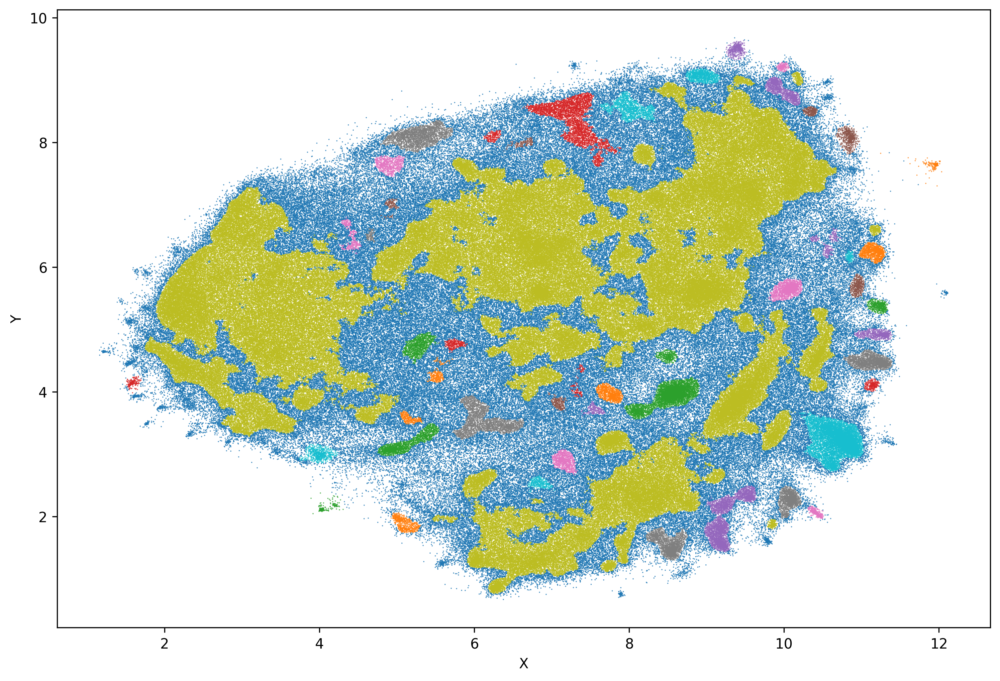

In [3]:
from easy_text_clustering.clusterer import ClusterClassifier
bcc = ClusterClassifier(embed_device='cuda', summary_create=False)
bcc.fit(random_subset, clustering_args={'cluster_selection_method':'leaf','min_cluster_size':150, 'cluster_selection_epsilon':0.075})
bcc.save('2nd-buddhist-500k-sample-cc')
bcc.show()

#### Inference on Full Buddhist Material

In [4]:
labels, embeddings = bcc.infer(b_texts)

Batches:   0%|          | 0/17123 [00:00<?, ?it/s]

100%|██████████| 1095824/1095824 [00:05<00:00, 187924.29it/s]


In [5]:
new_cc = ClusterClassifier()

new_cc.texts = b_texts
new_cc.embeddings = embeddings # from inference above
new_cc.projections, new_cc.mapper = new_cc.project(embeddings, 'umap', {})
new_cc.cluster_labels = labels # from inference above
new_cc.store_cluster_info(new_cc.cluster_labels)

INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: all-MiniLM-L6-v2
/home/j/Desktop/MLotsawa/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
Projecting embeddings:   0%|          | 0/9 [00:00<?, ?it/s]/home/j/Desktop/MLotsawa/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
Projecting embeddings:  11%|█         | 1/9 [00:43<05:51, 43.90s/it]/home/j/Desktop/MLotsawa/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
Projecting embeddings:  22%|██▏       | 2/9 [01:23<04:47, 41.13s/it]/home/j/Desktop/MLotsawa/.venv/lib/python3.12/site-package

In [6]:
new_cc.cluster_summaries = {}
new_cc.save('buddhist-inferred-cc')

In [7]:
new_cc.cluster_summaries = new_cc.summarize(new_cc.texts, new_cc.cluster_labels)

Request:
<s>[INST]Example 1:
Also, when you know that the self does not exist intrinsically, you also overcome the conception that the aggregates which are its components exist intrinsically just as when a chariot is burned, the wheels and such that are its parts are also burned.

Example 2:
But that is not the case—due to concepts from seeing a chariot before, one thinks of the discrete parts like wheels as “the parts of the chariot” when one sees them.

Example 3:
Therefore, things such as chariots do exist.

Example 4:
In that case, the wheels and so on are asserted as the appropriated, and the chariot is asserted as the appropriator. In the same way, from the perspective of what is accepted in the world and in order to present the relative truth without eliminating its conventions, it is taught that the self is imputed in dependence upon the five aggregates, the six inner constituents, and the six sources of form and so on.

Example 5:
 Through this they also easily engage in suchn

In [8]:
new_cc.save('buddhist-inferred-cc')

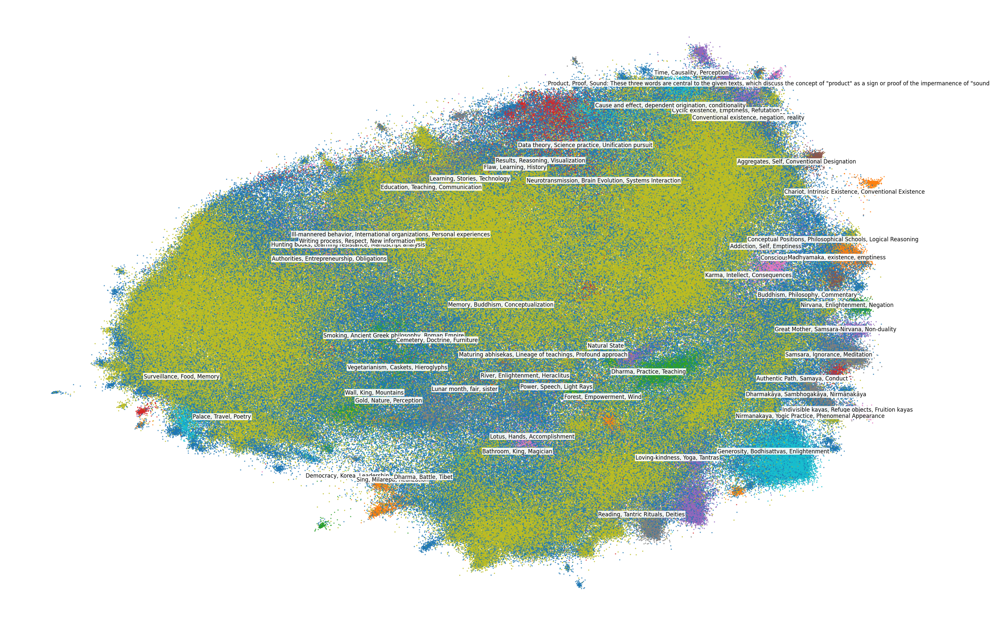

In [9]:
new_cc.show()

### Extract Meaningful Clusters

In [10]:
new_cc.cluster_summaries

{-1: 'None',
 0: 'Chariot, Intrinsic Existence, Conventional Existence',
 1: 'Democracy, Korea, Leadership',
 2: 'Surveillance, Food, Memory',
 3: 'Time, Causality, Perception',
 4: 'Aggregates, Self, Conventional Designation',
 5: 'Indivisible kayas, Refuge objects, Fruition kayas',
 6: 'Dharmakāya, Sambhogakāya, Nirmāṇakāya',
 7: 'Nirmanakaya, Yogic Practice, Phenomenal Appearance',
 8: 'Palace, Travel, Poetry',
 9: 'Sing, Milarepa, Realization',
 10: 'Nirvana, Enlightenment, Negation',
 11: 'Authentic Path, Samaya, Conduct',
 12: 'Addiction, Self, Emptiness',
 13: 'Buddhism, Philosophy, Commentary',
 14: 'Hunting books, Learning resistance, Manuscript analysis',
 15: 'Education, Teaching, Communication',
 16: 'Conceptual Positions, Philosophical Schools, Logical Reasoning',
 17: 'Consciousness, Reality, Emptiness',
 18: 'Madhyamaka, existence, emptiness',
 19: 'Natural State',
 20: 'Learning, Stories, Technology',
 21: 'Great Mother, Samsara-Nirvana, Non-duality',
 22: 'Flaw, Learni

In [ ]:
new_cc.label2docs[51]

In [23]:
b_idx_dict = {}

In [22]:
#'Intrinsic Existence, Conventional Existence'
existence = [0]
#'Time, Causality, Perception'
tcp = [3]
#'Aggregates, Self, Conventional Designation'
agg = [4]
#'Kayas'
kayas = [5,6,7]
#'Milarepa, Realization, Biography'
mil = [9]
#'Samaya, Conduct'
sam = [11]
#'Emptiness'
empt = [12,17,18,39]
#'Education, Teaching, Communication'
edu = [15]
#'Conceptual Positions, Philosophical Schools, Logical Reasoning'
logic = [16]
#'Natural State'
nat_state = [19]
# 'Great Mother, Samsara-Nirvana, Non-duality'
non_dual = [21]
# 'Tantra'
tantra = [24,47,48]
# 'Karma, Consequences'
karma = [32]
# 'Cause and effect, dependent origination, conditionality'
condition = [44]

In [29]:
extend_buddhist_label('Intrinsic Existence, Conventional Existence',existence)
extend_buddhist_label('Time, Causality, Perception',tcp)
extend_buddhist_label('Aggregates, Self, Conventional Designation',agg)
extend_buddhist_label('Kayas',kayas)
extend_buddhist_label('Milarepa, Realization, Biography',mil)
extend_buddhist_label('Samaya, Conduct',sam)
extend_buddhist_label('Emptiness',empt)
extend_buddhist_label('Education, Teaching',edu)
extend_buddhist_label('Conceptual Positions, Philosophical Schools, Logical Reasoning',logic)
extend_buddhist_label('Conceptual Positions, Logical Reasoning',logic)
extend_buddhist_label('Natural State',nat_state)
extend_buddhist_label('Samsara-Nirvana, Non-duality',non_dual)
extend_buddhist_label('Tantra',tantra)
extend_buddhist_label('Karma, Consequences',karma)
extend_buddhist_label('Cause and effect, dependent origination, conditionality',condition)

770
1288
1560
5162
1522
627
6795
5693
668
668
921
1778
14121
4102
2447


In [30]:
with open('buddhist-labels-idx-dict.pkl', 'wb') as handle:
    pickle.dump(b_idx_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [31]:
non_buddhist_idx = []

for val in nb_idx_dict.values():
    non_buddhist_idx.extend(val)

buddhist_idx = list(set(range(len(new_cc.texts))) - set(non_buddhist_idx))

print(len(buddhist_idx))

984576


In [32]:
buddhist_cat_idx = []

for val in b_idx_dict.values():
    buddhist_cat_idx.extend(val)

uncat_idx = list(set(range(len(buddhist_idx))) - set(buddhist_cat_idx))

print(len(uncat_idx))

945805


In [33]:
with open('uncat-idx-list.pkl', 'wb') as handle:
    pickle.dump(uncat_idx, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [18]:
[new_cc.texts[_] for _ in new_cc.label2docs[51]]

['Here is a scudo for your expenses.',
 'As mentioned, Smith had forged an Enterprise Board resolution to secure a loan from Union in February 1973. Now, when the bank sought to enforce the agreement contained in the resolution, the board informed the bank’s officers that there was no such resolution.',
 "Even if you did go around saving guys' lives and all, how would you know if you did it because you really wanted to save guys' lives, or because you did it because what you really wanted to do was be a terrific lawyer, with everybody slapping you on the back and congratulating you in court when the goddam trial was over, the reporters and everybody, the way it is in the dirty movies?",
 'We need go abroad for nothing.',
 'Life is so funny!You came with nothing, then fight for everything and later leave everything Behind and Go with nothing.',
 'Now, having spent three years in retreat, we must part.',
 'Love your master; for he belongs to that vast family of fifty thousand elementary 

In [19]:
med_bio = [34]
science = [26,34]
hist_pol = [1,31,50,51]
law = []
fiction = []
business = [20]
lang_cult = []
journalism = []

In [ ]:
import pickle

with open('non-buddhist-labels-idx-dict.pkl', 'rb') as handle:
    nb_idx_dict = pickle.load(handle)

def extend_buddhist_label(label, new_idx_lists):

    #print(len(b_idx_dict[label]))

    #b_idx_dict[label] = []

    new_idx = []

    for elt in new_idx_lists:
        new_idx.extend(new_cc.label2docs[elt])

    new_orig_idx = [b_dict[_]['orig_idx'] for _ in new_idx]

    b_idx_dict[label].extend(new_orig_idx)

    print(len(b_idx_dict[label]))

def extend_nb_label(label, new_idx_lists):

    print(len(nb_idx_dict[label]))

    new_idx = []

    for elt in new_idx_lists:
        new_idx.extend(new_cc.label2docs[elt])

    new_orig_idx = [b_dict[_]['orig_idx'] for _ in new_idx]

    nb_idx_dict[label].extend(new_orig_idx)

    print(len(nb_idx_dict[label]))

def update_idx():
    idx_dict = {}

    non_buddhist_idx = []

    for val in nb_idx_dict.values():
        non_buddhist_idx.extend(val)

    buddhist_idx = list(set(range(len(new_cc.texts))) - set(non_buddhist_idx))

    idx_dict['Buddhist'] = buddhist_idx
    idx_dict['Non-Buddhist'] = non_buddhist_idx

    with open('buddhist-or-no-idx-dict.pkl', 'wb') as handle:
        pickle.dump(idx_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [21]:
extend_nb_label('Medicine & Biology', med_bio)
extend_nb_label('Science', science)
extend_nb_label('History & Politics', hist_pol)
extend_nb_label('Law', law)
extend_nb_label('Fiction', fiction)
extend_nb_label('Business', business)
extend_nb_label('Language & Culture', lang_cult)
extend_nb_label('Journalism', journalism)


with open('non-buddhist-labels-idx-dict.pkl', 'wb') as handle:
    pickle.dump(nb_idx_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

update_idx()

31819
33818
23575
28838
61386
63520
1345
1345
16771
16771
6720
7230
21900
21900
281
281
